In [104]:
%load_ext autoreload
%autoreload 2
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import dnnlib
import pickle
import matplotlib.pyplot as plt
from Utils.basic_utils import *
from Utils.cfg_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [94]:
device = torch.device('cuda')

# Naive Conditional Generation vs. Classifier-Free-Guidance (CFG)

## Below we visualize the samples generated by naive conditional sampling and CFG sampling respectively. Note that the samples from native conditonal sampling are blurry,  have low perceptual quality, and lack class-specificty. In contrast, CFG greatly improves the overall image quality, making image details sharper and enhancing the class-specific details.

100%|██████████| 10/10 [00:00<00:00, 26.95step/s]


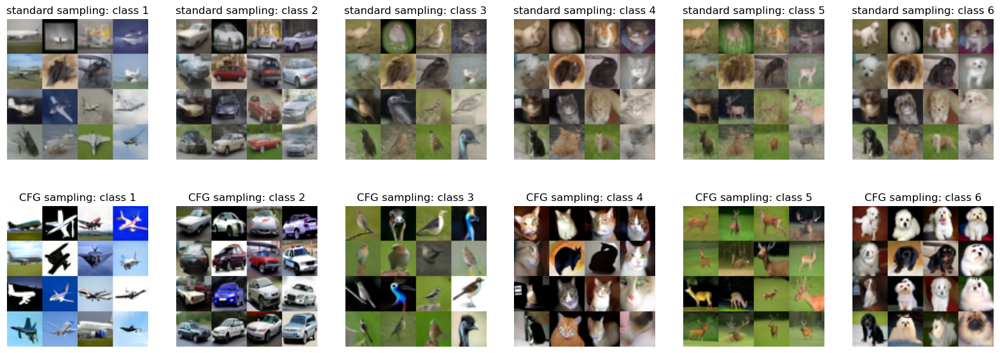

100%|██████████| 10/10 [00:00<00:00, 24.99step/s]


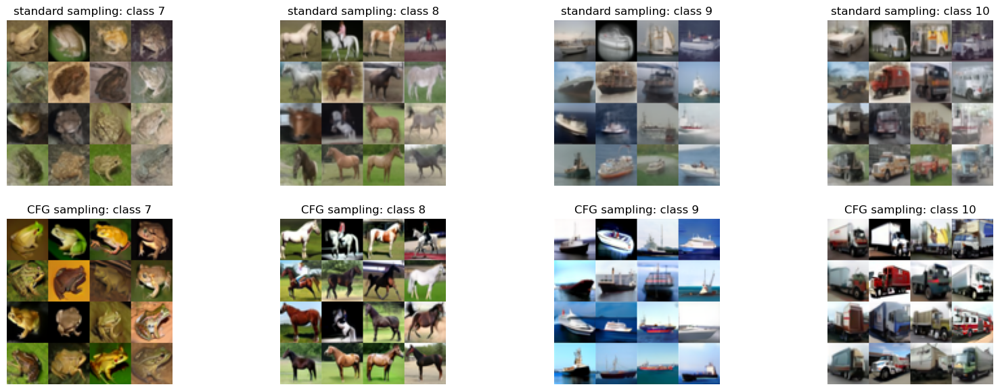

In [120]:
# Cifar-10:

torch.manual_seed(0)

class_idx_list = [0,1,2,3,4,5] #[0,1,2,3,4,5,6,7,8,9]
class_idx_list_2 = [6,7,8,9] #[0,1,2,3,4,5,6,7,8,9]



# Prepare conditional EDM model
net_cond_pkl = 'https://nvlabs-fi-cdn.nvidia.com/edm/pretrained/edm-cifar10-32x32-cond-ve.pkl'
with dnnlib.util.open_url(net_cond_pkl) as f:
    net_cond = pickle.load(f)['ema'].to(device)

# Prepare unconditional EDM model
net_uncond_pkl = 'https://nvlabs-fi-cdn.nvidia.com/edm/pretrained/edm-cifar10-32x32-uncond-ve.pkl'
with dnnlib.util.open_url(net_uncond_pkl) as f:
    net_uncond = pickle.load(f)['ema'].to(device)

    
num_show = 16 # number of generated samples
num_steps = 10 # number of reverse sampling steps
num_channels = 3
resolution = 32
latents = torch.randn(num_show, num_channels, resolution, resolution).to(device) # initial noise
guidance_strength = 4 # guidance strength
interval = (80.0, 0) # interval in which CFG is used, in this example, cfg is used at every noise level

naive_conditional_sampling_list = []
cfg_sampling_list = []

for i in range(len(class_idx_list)):
    class_idx = class_idx_list[i]
    
    # Standard (naive) conditional generation with EDM
    sigma_list, _, denoised_intermediates_EDM_cond = generate_image(net_cond, latents, num_steps=num_steps, class_idx=class_idx, device=device)

    # CFG generation with EDM model (interval 1)
    sigma_list, _, denoised_intermediates_EDM_cfg_cond, denoised_intermediates_EDM_cfg_uncond = generate_image_EDM_cfg_limited_interval(net_uncond, net_cond, latents , guidance_strength, interval[0], interval[1], num_steps=num_steps, class_idx=class_idx, device=device)
    
    naive_conditional_sampling_list.append(denoised_intermediates_EDM_cond[-1])
    cfg_sampling_list.append(denoised_intermediates_EDM_cfg_cond[-1])

plt.figure(figsize=(20,7))
for i in range(len(class_idx_list)):
    plt.subplot(2,len(class_idx_list),1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
    plt.subplot(2, len(class_idx_list), 1+i+len(class_idx_list))
    plt.title('CFG sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(cfg_sampling_list[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
plt.show()

naive_conditional_sampling_list_2 = []
cfg_sampling_list_2 = []

for i in range(len(class_idx_list_2)):
    class_idx = class_idx_list_2[i]
    
    # Standard (naive) conditional generation with EDM
    sigma_list, _, denoised_intermediates_EDM_cond = generate_image(net_cond, latents, num_steps=num_steps, class_idx=class_idx, device=device)

    # CFG generation with EDM model (interval 1)
    sigma_list, _, denoised_intermediates_EDM_cfg_cond, denoised_intermediates_EDM_cfg_uncond = generate_image_EDM_cfg_limited_interval(net_uncond, net_cond, latents , guidance_strength, interval[0], interval[1], num_steps=num_steps, class_idx=class_idx, device=device)
    
    naive_conditional_sampling_list_2.append(denoised_intermediates_EDM_cond[-1])
    cfg_sampling_list_2.append(denoised_intermediates_EDM_cfg_cond[-1])

plt.figure(figsize=(20,7))
for i in range(len(class_idx_list_2)):
    plt.subplot(2,len(class_idx_list_2),1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list_2[i]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list_2[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
    plt.subplot(2, len(class_idx_list_2), 1+i+len(class_idx_list_2))
    plt.title('CFG sampling:'+' class '+str(class_idx_list_2[i]+1))
    plt.imshow(get_image_grid(cfg_sampling_list_2[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
plt.show()

## Despite being conditioned on different labels, the smaples generated from the same initial noise often exhibit high structural similarity, lack class-specific features. For some cases, it is even impossible to identify the class by eye. In contrast, CFG generates samples with distinct class-specific patterns.

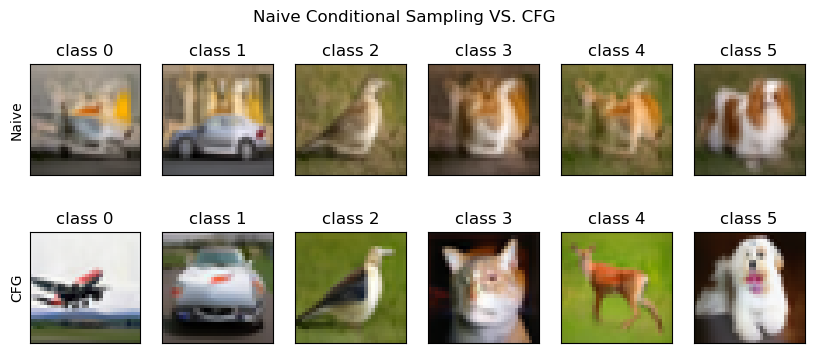

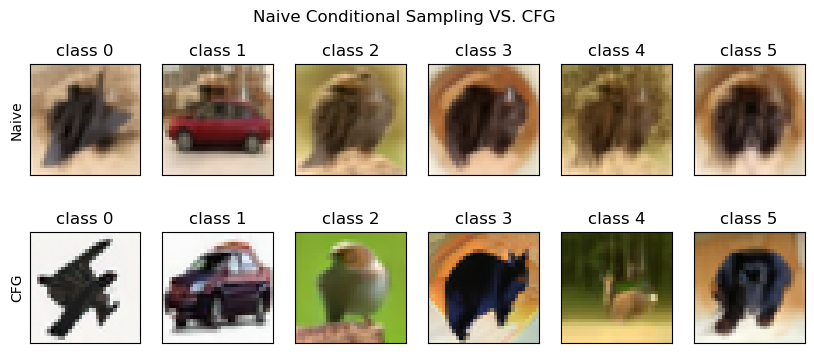

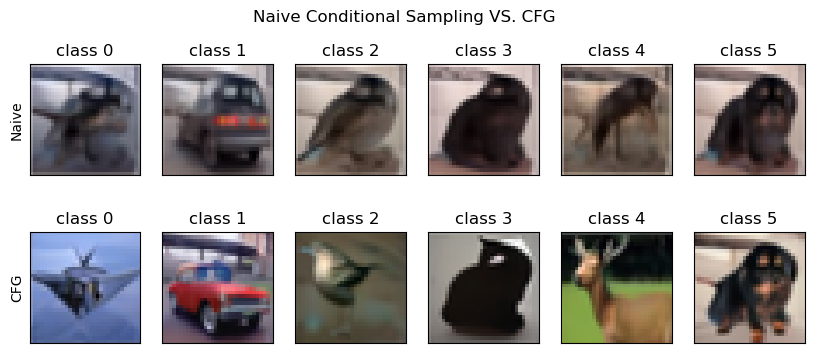

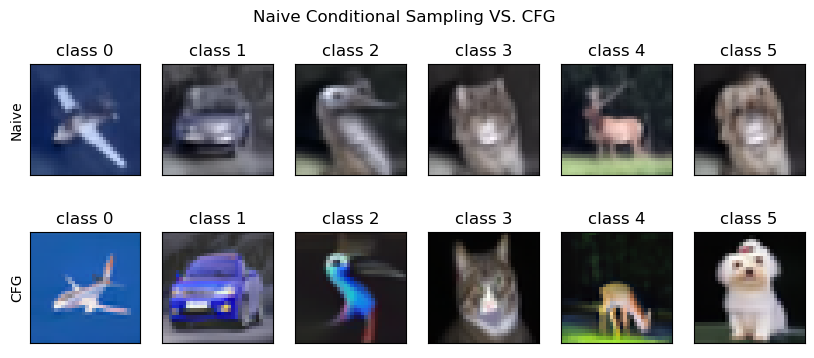

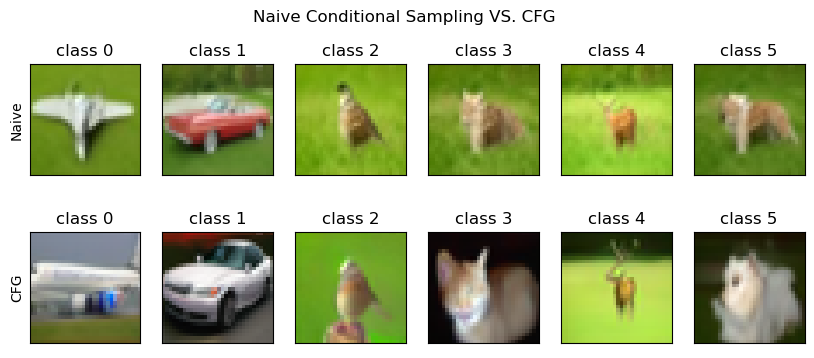

In [121]:
sample_idx = [2,5,6,9,14]
class_idx_list = [0,1,2,3,4,5]

for i in range(len(sample_idx)):
    plt.figure(figsize=(10,4))
    plt.suptitle('Naive Conditional Sampling VS. CFG')
    for j in range(len(class_idx_list)):
        plt.subplot(2,6,j+1)
        plt.title('class '+str(class_idx_list[j]))
        plt.imshow(normalize_image(naive_conditional_sampling_list[j][sample_idx[i]].permute(1,2,0)))
        plt.xticks([])
        plt.yticks([])
        if j==0:
            plt.ylabel('Naive')

        plt.subplot(2,6,j+1+6)
        plt.title('class '+str(class_idx_list[j]))
        plt.imshow(normalize_image(cfg_sampling_list[j][sample_idx[i]].permute(1,2,0)))
        plt.xticks([])
        plt.yticks([])
        if j==0:
            plt.ylabel('CFG')
        
    plt.show()

## The observations above also hold for analytical linear diffusion models.
### Key Observations: (i) Despite build from class-specific means and covariances, naive conditional sampling using linear diffusion models genearate highly similar samples. (ii) CFG alleiviates this issue.

100%|██████████| 10/10 [00:00<00:00, 591.29step/s]


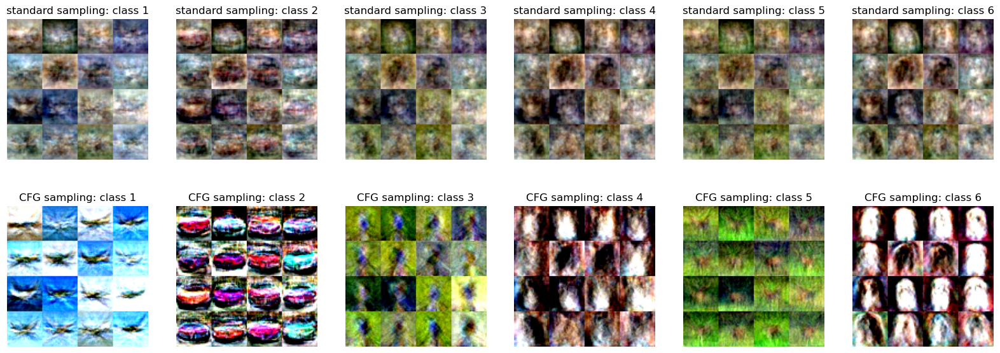

100%|██████████| 10/10 [00:00<00:00, 592.69step/s]


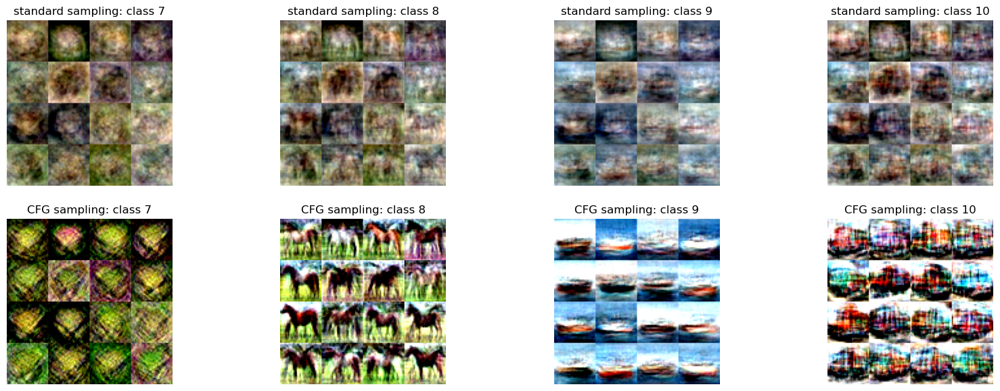

In [117]:
device = torch.device('cuda')
rank = 3*32*32 # we use full rank here to avoid the singularity of score functions near zero noise
# Prepare unconditional linear diffusion model
mean_path_uncond = 'Covariance_Cifar/50000/mean.pt'
covariance_path_uncond = 'Covariance_Cifar/50000/covariance.pt' 
mean_uncond = torch.load(mean_path_uncond, weights_only=False)
mean_uncond = mean_uncond.to(device)
U, S, Vh = torch.load(covariance_path_uncond, weights_only=False)
U = U.to(device)
S = S.to(device)
Vh = Vh.to(device)

covariance_uncond = U, S, Vh

Gaussian_model_uncond = multi_gaussian(mean_uncond, covariance_uncond, low_rank=rank).to(device)

class_idx_list = [0,1,2,3,4, 5] 

class_idx_list_2 = [6,7,8,9] 

naive_conditional_sampling_list = []
cfg_sampling_list = []

guidance_strength = 4

for i in range(len(class_idx_list)):
    mean_path_cond = 'Covariance_Cifar/class'+str(class_idx_list[i])+'/mean.pt'
    covariance_path_cond = 'Covariance_Cifar/class'+str(class_idx_list[i])+'/covariance.pt'
    mean_cond = torch.load(mean_path_cond, weights_only=False)
    mean_cond = mean_cond.to(device)
    U, S, Vh = torch.load(covariance_path_cond, weights_only=False)
    U = U.to(device)
    S = S.to(device)
    Vh = Vh.to(device)
    covariance_cond = U, S, Vh
    Gaussian_model_cond = multi_gaussian(mean_cond, covariance_cond, low_rank=rank).to(device)
    sigma_list, _, denoised_intermediates_Gaussian_cond = generate_image_Gaussian(net_cond, Gaussian_model_cond, latents, num_steps=num_steps, device=device) # note we pass the EDM model (net_cond) here only for constructing the sampling schedule, the samples are purely generated by the linear model
    sigma_list, _, denoised_intermediates_Gaussian_cfg_cond, _ = generate_image_Gaussian_cfg(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents, guidance_strength=guidance_strength, num_steps=num_steps, device=device)
    naive_conditional_sampling_list.append(denoised_intermediates_Gaussian_cond[-1])
    cfg_sampling_list.append(denoised_intermediates_Gaussian_cfg_cond[-1])
    

plt.figure(figsize=(20,7))
for i in range(len(class_idx_list)):
    plt.subplot(2,len(class_idx_list),1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
    plt.subplot(2, len(class_idx_list), 1+i+len(class_idx_list))
    plt.title('CFG sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(cfg_sampling_list[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
plt.show()

naive_conditional_sampling_list = []
cfg_sampling_list = []

for i in range(len(class_idx_list_2)):
    mean_path_cond = 'Covariance_Cifar/class'+str(class_idx_list_2[i])+'/mean.pt'
    covariance_path_cond = 'Covariance_Cifar/class'+str(class_idx_list_2[i])+'/covariance.pt'
    mean_cond = torch.load(mean_path_cond, weights_only=False)
    mean_cond = mean_cond.to(device)
    U, S, Vh = torch.load(covariance_path_cond, weights_only=False)
    U = U.to(device)
    S = S.to(device)
    Vh = Vh.to(device)
    covariance_cond = U, S, Vh
    Gaussian_model_cond = multi_gaussian(mean_cond, covariance_cond, low_rank=rank).to(device)
    sigma_list, _, denoised_intermediates_Gaussian_cond = generate_image_Gaussian(net_cond, Gaussian_model_cond, latents, num_steps=num_steps, device=device) # note we pass the EDM model (net_cond) here only for constructing the sampling schedule, the samples are purely generated by the linear model
    sigma_list, _, denoised_intermediates_Gaussian_cfg_cond, _ = generate_image_Gaussian_cfg(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents, guidance_strength=guidance_strength, num_steps=num_steps, device=device)
    naive_conditional_sampling_list.append(denoised_intermediates_Gaussian_cond[-1])
    cfg_sampling_list.append(denoised_intermediates_Gaussian_cfg_cond[-1])
    

plt.figure(figsize=(20,7))
for i in range(len(class_idx_list_2)):
    plt.subplot(2,len(class_idx_list_2),1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list_2[i]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
    plt.subplot(2, len(class_idx_list_2), 1+i+len(class_idx_list_2))
    plt.title('CFG sampling:'+' class '+str(class_idx_list_2[i]+1))
    plt.imshow(get_image_grid(cfg_sampling_list[i], num_row=4, num_col=4, resolution=32, clip=True))
    plt.axis('off')
plt.show()

# Now, let's do the same sets of experiments on ImageNet models. The phenomenon holds the same:
## (i) naive conditional sampling generates samples with supar quality, lacking class-specific features, (ii) CFG greatly enhances the visual quality and class-specific patterns and (iii) Same phenomenon can be observed in linear diffusion models.

100%|██████████| 10/10 [00:01<00:00,  8.80step/s]


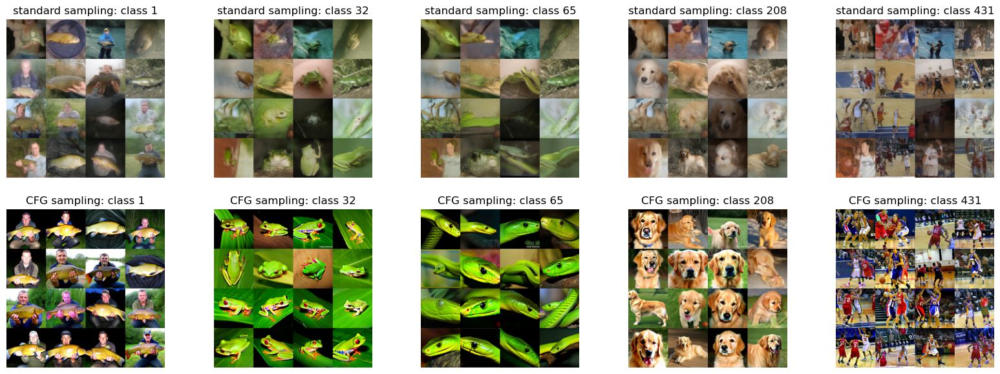

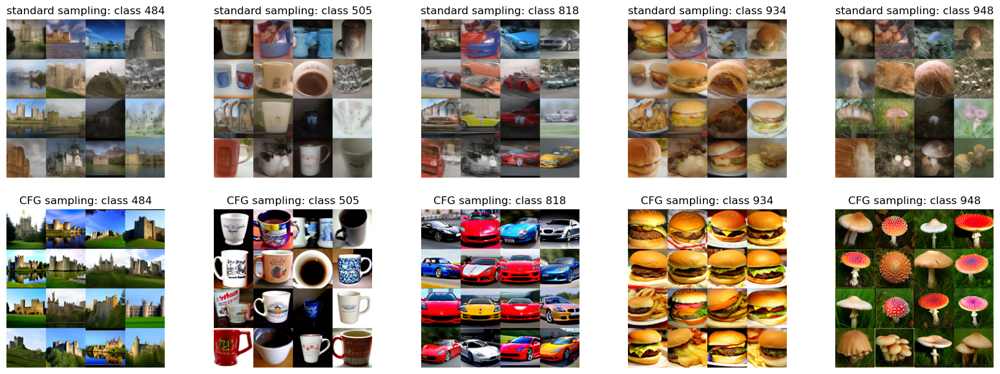

In [123]:
torch.manual_seed(0)

# Load conditional EDM model
net_cond_pkl = 'https://nvlabs-fi-cdn.nvidia.com/edm/pretrained/edm-imagenet-64x64-cond-adm.pkl'
with dnnlib.util.open_url(net_cond_pkl) as f:
    net_cond = pickle.load(f)['ema'].to(device)

# Load unconditional EDM model, this one is trained by ourselves from scratch
net_uncond_pkl = 'Imagenet_weights/network-snapshot-048000.pkl'

with dnnlib.util.open_url(net_uncond_pkl) as f:
    net_uncond = pickle.load(f)['ema'].to(device)

class_idx_list = [0, 31, 64, 207, 430, 483, 504, 817, 933, 947] # 10 randomly selected classes from ImageNet (1000 classes in total)
    
num_show = 16
num_steps = 10
num_channels = 3
resolution = 64
latents = torch.randn(num_show, num_channels, resolution, resolution).to(device)
guidance_strength = 4

interval = (80.0, 0.02)

naive_conditional_sampling_list = []
cfg_sampling_list = []

for i in range(len(class_idx_list)):
    class_idx = class_idx_list[i]
    
    # Standard (naive) conditional generation with EDM
    sigma_list, _, denoised_intermediates_EDM_cond = generate_image(net_cond, latents, num_steps=num_steps, class_idx=class_idx, device=device)

    # CFG generation with EDM model (interval 1)
    sigma_list, _, denoised_intermediates_EDM_cfg_cond, denoised_intermediates_EDM_cfg_uncond = generate_image_EDM_cfg_limited_interval(net_uncond, net_cond, latents , guidance_strength, interval[0], interval[1], num_steps=num_steps, class_idx=class_idx, device=device)
    
    naive_conditional_sampling_list.append(denoised_intermediates_EDM_cond[-1])
    cfg_sampling_list.append(denoised_intermediates_EDM_cfg_cond[-1])

plt.figure(figsize=(20,7))
for i in range(5):
    plt.subplot(2,5,1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list[i], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
    plt.subplot(2, 5, 1+i+5)
    plt.title('CFG sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(cfg_sampling_list[i], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
plt.show()

plt.figure(figsize=(20,7))
for i in range(5):
    plt.subplot(2,5,1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list[i+5]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list[i+5], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
    plt.subplot(2, 5, 1+i+5)
    plt.title('CFG sampling:'+' class '+str(class_idx_list[i+5]+1))
    plt.imshow(get_image_grid(cfg_sampling_list[i+5], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
plt.show()

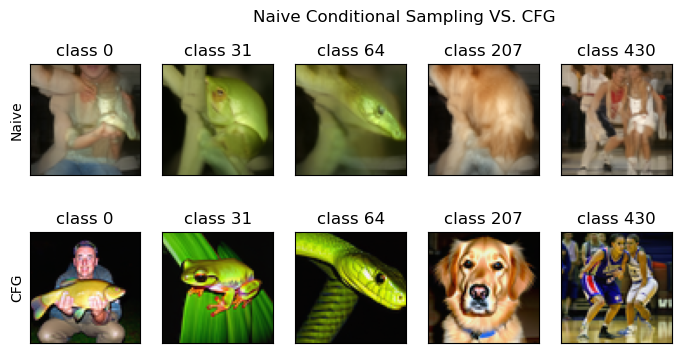

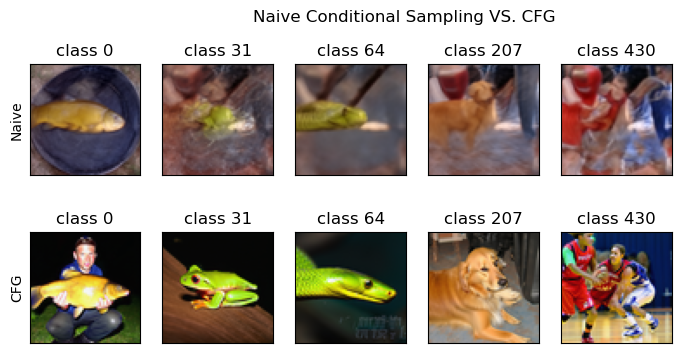

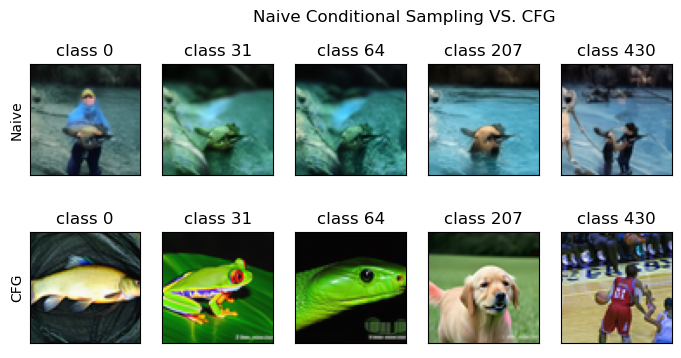

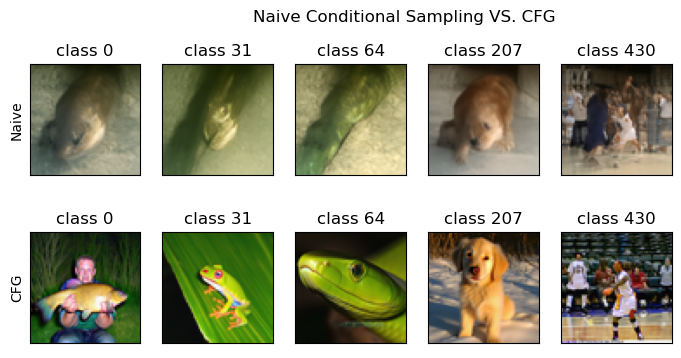

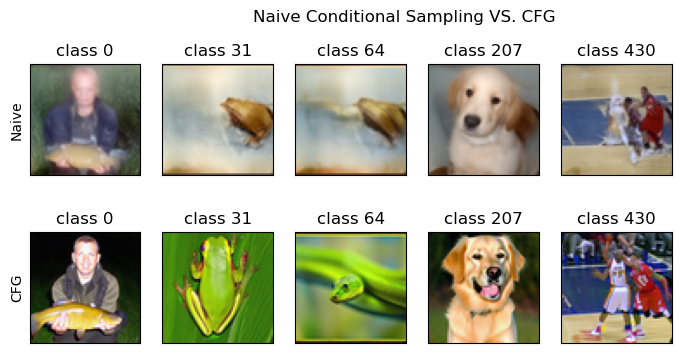

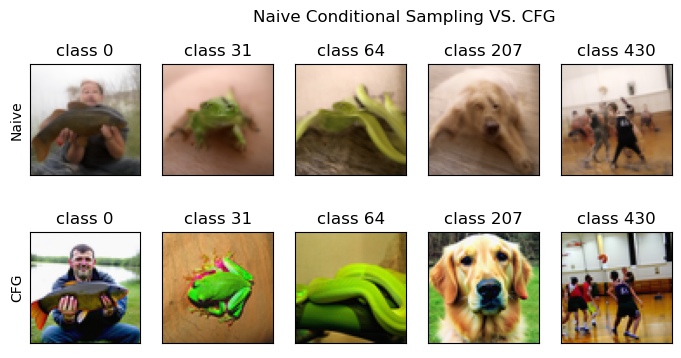

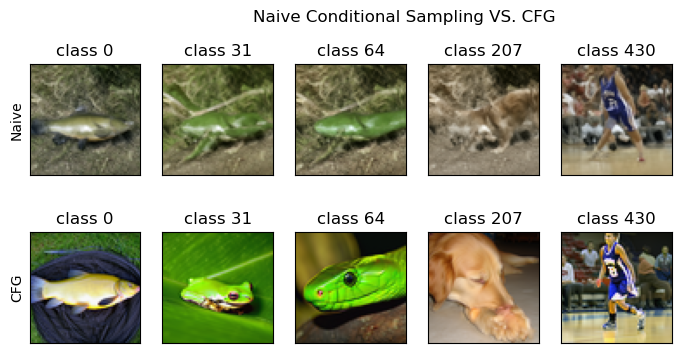

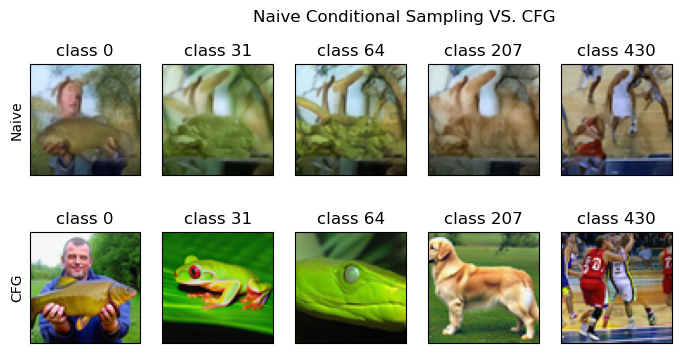

In [126]:
sample_idx = [0,1,2,3,4,6,7,8]
# class_idx_list = [0,1,2,3,4,5]
class_idx_list = [0, 31, 64, 207, 430]
for i in range(len(sample_idx)):
    plt.figure(figsize=(10,4))
    plt.suptitle('Naive Conditional Sampling VS. CFG')
    for j in range(len(class_idx_list)):
        plt.subplot(2,6,j+1)
        plt.title('class '+str(class_idx_list[j]))
        plt.imshow(normalize_image(naive_conditional_sampling_list[j][sample_idx[i]].permute(1,2,0)))
        plt.xticks([])
        plt.yticks([])
        if j==0:
            plt.ylabel('Naive')

        plt.subplot(2,6,j+1+6)
        plt.title('class '+str(class_idx_list[j]))
        plt.imshow(normalize_image(cfg_sampling_list[j][sample_idx[i]].permute(1,2,0)))
        plt.xticks([])
        plt.yticks([])
        if j==0:
            plt.ylabel('CFG')
        
    plt.show()

100%|██████████| 10/10 [00:00<00:00, 62.13step/s]


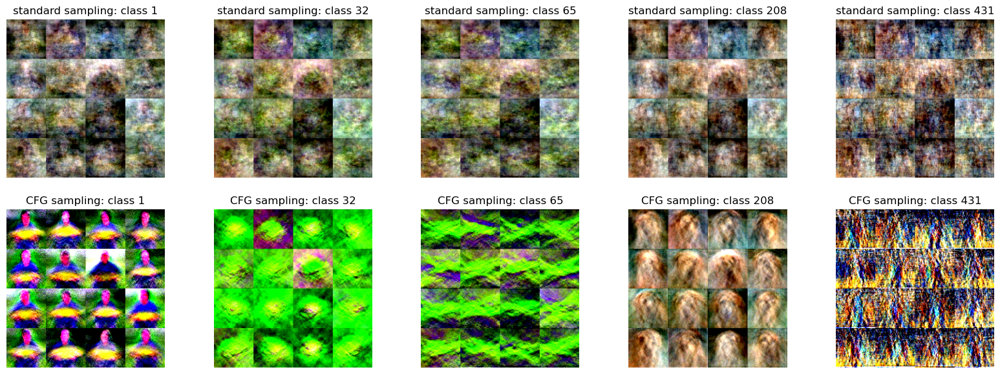

100%|██████████| 10/10 [00:00<00:00, 58.97step/s]


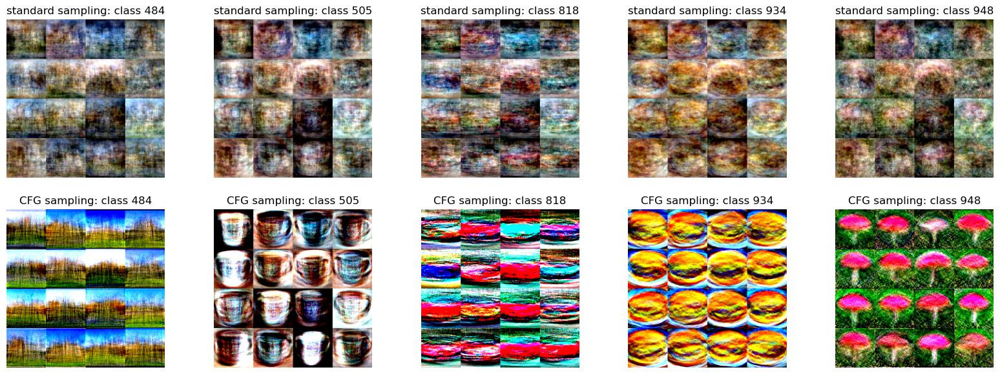

In [129]:
device = torch.device('cuda')
rank = 3*64*64 # we use full rank here to avoid the singularity of score functions near zero noise
# Prepare unconditional linear diffusion model
mean_path_uncond = 'Covariance_ImageNetGenerated/uncond/mean.pt'
covariance_path_uncond = 'Covariance_ImageNetGenerated/uncond/covariance.pt' 
mean_uncond = torch.load(mean_path_uncond, weights_only=False)
mean_uncond = mean_uncond.to(device)
U, S, Vh = torch.load(covariance_path_uncond, weights_only=False)
U = U.to(device)
S = S.to(device)
Vh = Vh.to(device)

covariance_uncond = U, S, Vh

Gaussian_model_uncond = multi_gaussian(mean_uncond, covariance_uncond, low_rank=rank).to(device)

class_idx_list = [0, 31, 64, 207, 430]

class_idx_list_2 = [483, 504, 817, 933, 947]

naive_conditional_sampling_list = []
cfg_sampling_list = []

guidance_strength = 4

for i in range(len(class_idx_list)):
    mean_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx_list[i])+'/mean.pt'
    covariance_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx_list[i])+'/covariance.pt'
    mean_cond = torch.load(mean_path_cond, weights_only=False)
    mean_cond = mean_cond.to(device)
    U, S, Vh = torch.load(covariance_path_cond, weights_only=False)
    U = U.to(device)
    S = S.to(device)
    Vh = Vh.to(device)
    covariance_cond = U, S, Vh
    Gaussian_model_cond = multi_gaussian(mean_cond, covariance_cond, low_rank=rank).to(device)
    sigma_list, _, denoised_intermediates_Gaussian_cond = generate_image_Gaussian(net_cond, Gaussian_model_cond, latents, num_steps=num_steps, device=device) # note we pass the EDM model (net_cond) here only for constructing the sampling schedule, the samples are purely generated by the linear model
    sigma_list, _, denoised_intermediates_Gaussian_cfg_cond, _ = generate_image_Gaussian_cfg(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents, guidance_strength=guidance_strength, num_steps=num_steps, device=device)
    naive_conditional_sampling_list.append(denoised_intermediates_Gaussian_cond[-1])
    cfg_sampling_list.append(denoised_intermediates_Gaussian_cfg_cond[-1])
    

plt.figure(figsize=(20,7))
for i in range(len(class_idx_list)):
    plt.subplot(2,len(class_idx_list),1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list[i], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
    plt.subplot(2, len(class_idx_list), 1+i+len(class_idx_list))
    plt.title('CFG sampling:'+' class '+str(class_idx_list[i]+1))
    plt.imshow(get_image_grid(cfg_sampling_list[i], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
plt.show()

naive_conditional_sampling_list = []
cfg_sampling_list = []

for i in range(len(class_idx_list_2)):
    mean_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx_list_2[i])+'/mean.pt'
    covariance_path_cond = 'Covariance_ImageNetGenerated/class_'+str(class_idx_list_2[i])+'/covariance.pt'
    mean_cond = torch.load(mean_path_cond, weights_only=False)
    mean_cond = mean_cond.to(device)
    U, S, Vh = torch.load(covariance_path_cond, weights_only=False)
    U = U.to(device)
    S = S.to(device)
    Vh = Vh.to(device)
    covariance_cond = U, S, Vh
    Gaussian_model_cond = multi_gaussian(mean_cond, covariance_cond, low_rank=rank).to(device)
    sigma_list, _, denoised_intermediates_Gaussian_cond = generate_image_Gaussian(net_cond, Gaussian_model_cond, latents, num_steps=num_steps, device=device) # note we pass the EDM model (net_cond) here only for constructing the sampling schedule, the samples are purely generated by the linear model
    sigma_list, _, denoised_intermediates_Gaussian_cfg_cond, _ = generate_image_Gaussian_cfg(net_cond, Gaussian_model_cond, Gaussian_model_uncond, latents, guidance_strength=guidance_strength, num_steps=num_steps, device=device)
    naive_conditional_sampling_list.append(denoised_intermediates_Gaussian_cond[-1])
    cfg_sampling_list.append(denoised_intermediates_Gaussian_cfg_cond[-1])
    

plt.figure(figsize=(20,7))
for i in range(len(class_idx_list_2)):
    plt.subplot(2,len(class_idx_list_2),1+i)
    plt.title('standard sampling:'+' class '+str(class_idx_list_2[i]+1))
    plt.imshow(get_image_grid(naive_conditional_sampling_list[i], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
    plt.subplot(2, len(class_idx_list_2), 1+i+len(class_idx_list_2))
    plt.title('CFG sampling:'+' class '+str(class_idx_list_2[i]+1))
    plt.imshow(get_image_grid(cfg_sampling_list[i], num_row=4, num_col=4, resolution=64, clip=True))
    plt.axis('off')
plt.show()